In [1]:
import numpy as np 
import pandas as pd
import json 
import csv
import nltk
import unicodedata
import re
import sys
from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora, models
from gensim.utils import simple_preprocess
import gensim, spacy
from gensim.models.ldamulticore import LdaMulticore
import re
from gensim.models import Phrases
from gensim.models.phrases import Phraser

import os

In [2]:
pip install git+https://github.com/rwalk/gsdmm.git

  Cloning https://github.com/rwalk/gsdmm.git to /private/var/folders/0m/nt9pl1nx6wg6ms29y0rk74nw0000gn/T/pip-req-build-1m223tp4
  Running command git clone -q https://github.com/rwalk/gsdmm.git /private/var/folders/0m/nt9pl1nx6wg6ms29y0rk74nw0000gn/T/pip-req-build-1m223tp4
Note: you may need to restart the kernel to use updated packages.


In [3]:
from gsdmm import MovieGroupProcess

In [4]:
df = pd.read_csv("pos_neg_india.csv")
df

,Unnamed: 0,index,Text,new_text,languages,translated,new_languages,pos_tagged_words,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,0,0,soniya mummy hoti toh covid me magic stick ghu...,soniya mummy hoti toh covid me magic stick ghu...,Unknown,soniya mummy hoti toh covid me magic stick ghu...,Unknown,"[('soniya', 'JJ'), ('mummy', 'NN'), ('hot', 'J...","['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,0
1,12,12,is covid ki waja se buht saray logon ne apne p...,is covid ki waja se buht saray logon ne apne p...,Unknown,is covid ki waja se buht saray logon ne apne p...,Unknown,"[('is', 'VBZ'), ('couid', 'JJ'), ('ki', 'NN'),...","['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2
2,18,18,deaths due covid what is vaccination rate what...,deaths due covid what is vaccination rate what...,"ENGLISH, Unknown",deaths due covid what is vaccination rate what...,"ENGLISH, Unknown","[('deaths', 'NNS'), ('due', 'JJ'), ('couid', '...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
3,28,28,vaccination against covid- 19 is necessity tod...,vaccination against covid- 19 is necessity tod...,ENGLISH,vaccination against covid- 19 is necessity tod...,ENGLISH,"[('vaccination', 'NN'), ('against', 'IN'), ('c...","['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
4,33,33,very surprising that unvaccinated population &...,very surprising that unvaccinated population &...,ENGLISH,very surprising that unvaccinated population &...,ENGLISH,"[('very', 'RB'), ('surprising', 'JJ'), ('that'...","['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37618,95179,95179,nature seems have already started working savi...,nature seems have already started working savi...,ENGLISH,nature seems have already started working savi...,ENGLISH,"[('nature', 'NN'), ('seems', 'VBZ'), ('have', ...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
37619,95180,95180,"dear , we #india 🇮🇳has helped this #world incl...","dear , we #india Indiahas helped this #world i...",ENGLISH,"dear , we #india Indiahas helped this #world i...",ENGLISH,"[('dear', 'IN'), ('we', 'PRP'), ('india', 'VBP...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2
37620,95184,95184,our sincere request state central govt 🙏🙏. ple...,our sincere request state central govt folded_...,ENGLISH,our sincere request state central govt folded_...,ENGLISH,"[('our', 'PRP$'), ('sincere', 'JJ'), ('request...","['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
37621,95185,95185,thanks your appreciation valuable feedback abo...,thanks your appreciation valuable feedback abo...,ENGLISH,thanks your appreciation valuable feedback abo...,ENGLISH,"[('thanks', 'NNS'), ('your', 'PRP$'), ('apprec...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2


In [5]:
df.drop(columns = ['Unnamed: 0', 'Text', 'index', 'new_text', 'languages', 'new_languages', 'pos_tagged_words'], inplace = True)
df

,translated,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,soniya mummy hoti toh covid me magic stick ghu...,"['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,0
1,is covid ki waja se buht saray logon ne apne p...,"['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2
2,deaths due covid what is vaccination rate what...,"['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
3,vaccination against covid- 19 is necessity tod...,"['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
4,very surprising that unvaccinated population &...,"['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0
...,...,...,...,...,...,...
37618,nature seems have already started working savi...,"['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
37619,"dear , we #india Indiahas helped this #world i...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2
37620,our sincere request state central govt folded_...,"['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
37621,thanks your appreciation valuable feedback abo...,"['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2


In [6]:
df['words_processed_all'].values[0][0]

'['

In [7]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [8]:
tokens_words_processed_all = list(sent_to_words(df['words_processed_all']))

In [9]:
from nltk.corpus import stopwords
stop_list = stopwords.words('english')
high_freq_known_words = ['covid','couid', 'pfizer', 'amp', 'people', 'covidvaccine', 'covishield', 'moderna', 'vaccine', 'astrazeneca', 'vaccinate', 'vaccinated', 'vaccination', 'vaccines']

stop_list.extend(high_freq_known_words)

test_words_only1 = ['not', 'vaccine', 'covid', 'and', 'vegan', 'cruelty', 'free', 'i', 'use', 'elf', 'cosmetics', 'every', 'day', 'and', 'i', 'love', 'it']
test_stopremoved = [w for w in test_words_only1 if w not in stop_list or w == 'not']
print(test_stopremoved)

['not', 'vegan', 'cruelty', 'free', 'use', 'elf', 'cosmetics', 'every', 'day', 'love']


In [10]:
stop_list

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [11]:
df['words_processed_all'] = tokens_words_processed_all

In [12]:
# remove stop words from tokenised_words_only

tokenised_stopremoved = [[w for w in each if w not in stop_list or w == 'not'] for each in tokens_words_processed_all]
tokenised_stopremoved

[['soniya',
  'mummy',
  'hot',
  'toh',
  'magic',
  'stick',
  'huma',
  'ke',
  'death',
  'kam',
  'kar',
  'deli',
  'aur',
  'rahul',
  'baba',
  'ape',
  'hadto',
  'se',
  'tayyar',
  'kake',
  'data'],
 ['ki',
  'raja',
  'se',
  'spray',
  'logon',
  'ne',
  'ape',
  'pardon',
  'ko',
  'khoja',
  'hai',
  'sare',
  'log',
  'ani',
  'jan',
  'se',
  'hath',
  'bethe',
  'agr',
  'ap',
  'susan',
  'se',
  'bacha',
  'chaste',
  'hair',
  'ply',
  'larva'],
 ['death',
  'due',
  'rate',
  'free',
  'safe',
  'sir',
  'gallian',
  'nikola',
  'ata',
  'tuck',
  'congress',
  'mubarak',
  'kashmir',
  'nha',
  'se',
  'kashmiri',
  'pandit',
  'ko',
  'braga',
  'mar',
  'gay',
  'harm',
  'parivartan',
  'rne',
  'bola',
  'gay',
  'wo',
  'mubarak',
  'dunny',
  'ke',
  'mubarak',
  'nai',
  'koi',
  'mubarak',
  'kashmir',
  'nha',
  'se',
  'kashmiri',
  'pandit',
  'ko',
  'braga',
  'mar',
  'gay',
  'harm'],
 ['nineteen',
  'necessity',
  'today',
  'scenario',
  'hoping

In [13]:
df['words_processed_all'].values[0][0]

'soniya'

In [14]:
df['tokenised_stopremoved'] = tokenised_stopremoved

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37623 entries, 0 to 37622
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   translated                         37623 non-null  object
 1   words_processed_all                37623 non-null  object
 2   words_processed_noun_adj_verb_adv  37623 non-null  object
 3   words_processed_noun               37623 non-null  object
 4   text_type                          37623 non-null  object
 5   sentiment                          37623 non-null  int64 
 6   tokenised_stopremoved              37623 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.0+ MB


# GSDMM for the topic modeling: 

In [16]:
np.random.seed(0)

In [17]:
df.info() # no empty rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37623 entries, 0 to 37622
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   translated                         37623 non-null  object
 1   words_processed_all                37623 non-null  object
 2   words_processed_noun_adj_verb_adv  37623 non-null  object
 3   words_processed_noun               37623 non-null  object
 4   text_type                          37623 non-null  object
 5   sentiment                          37623 non-null  int64 
 6   tokenised_stopremoved              37623 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.0+ MB


In [18]:
df['sentiment'].value_counts()

0    20029
2    17594
Name: sentiment, dtype: int64

In [19]:
negative_df = df[df['sentiment'] == 0]

In [20]:
negative_df

,translated,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment,tokenised_stopremoved
0,soniya mummy hoti toh covid me magic stick ghu...,"[soniya, mummy, hot, toh, couid, magic, stick,...",['death'],['death'],subjective,0,"[soniya, mummy, hot, toh, magic, stick, huma, ..."
4,very surprising that unvaccinated population &...,"[surprising, vaccinated, population, yr, force...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0,"[surprising, population, yr, forcefully, expos..."
7,"under guidance saint gurmeet ram rahim ji, der...","[guidance, saint, greet, ram, rahim, dear, sac...","['follower', 'take', 'pledge', 'get', 'vaccina...","['follower', 'pledge', 'couid', 'vaccination',...",subjective,0,"[guidance, saint, greet, ram, rahim, dear, sac..."
8,bro you know where was case covid detected ind...,"[bro, know, case, couid, detected, india, fact...","['case', 'detect', 'fail', 'bring', 'case', 'b...","['case', 'case', 'testing', 'people', 'vaccina...",subjective,0,"[bro, know, case, detected, india, fact, keral..."
9,your muslim teachers intellectuals boycott cov...,"[muslim, teacher, intellectual, boycott, couid...","['intellectual', 'education', 'top', 'leader',...","['intellectual', 'education', 'leader', 'healt...",subjective,0,"[muslim, teacher, intellectual, boycott, educa..."
...,...,...,...,...,...,...,...
37598,you are right. till today there is no mention ...,"[right, till, today, mention, local, train, av...","['right', 'today', 'mention', 'local', 'train'...","['today', 'train', 'availability', 'general_pu...",subjective,0,"[right, till, today, mention, local, train, av..."
37601,do we have eat scotch eggs until we are vaccin...,"[eat, scotch, vaccinate, little, confuse, rece...","['eat', 'scotch', 'vaccinate', 'little', 'conf...","['scotch', 'lot', 'emphasis', 'scotch']",subjective,0,"[eat, scotch, little, confuse, recently, seem,..."
37602,it means even if 50% vaccinated lead herd immu...,"[mean, even, fifty, vaccinated, lead, herd_imm...","['mean', 'even', 'vaccinated', 'lead', 'herd_i...","['lead', 'herd_immunity']",subjective,0,"[mean, even, fifty, lead, herd_immunity]"
37611,that is good decision. even two doses policy j...,"[good, decision, even, two, dose, policy, jab,...","['good', 'decision', 'even', 'dose', 'policy',...","['decision', 'dose', 'policy', 'jab', 'vaccine...",subjective,0,"[good, decision, even, two, dose, policy, jab,..."


In [21]:
negative_df['tokenised_stopremoved'].values[0][0]

'soniya'

In [22]:
negative_tokenised_lemmatized = list(sent_to_words(negative_df['tokenised_stopremoved']))

In [23]:
negative_tokenised_lemmatized[0][0]

'soniya'

In [24]:
len(negative_tokenised_lemmatized)

20029

In [25]:
def top_words(cluster_word_distribution, top_cluster, values):
    for cluster in top_cluster:
        sort_dicts =sorted(mgp.cluster_word_distribution[cluster].items(), key=lambda k: k[1], reverse=True)[:values]
        print("\nCluster %s : %s"%(cluster,sort_dicts))

### Cluster size: 4

In [26]:
mgp = MovieGroupProcess(K=4, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 13334 clusters with 4 clusters populated
In stage 1: transferred 9190 clusters with 4 clusters populated
In stage 2: transferred 7317 clusters with 4 clusters populated
In stage 3: transferred 5418 clusters with 4 clusters populated
In stage 4: transferred 4241 clusters with 4 clusters populated
In stage 5: transferred 3674 clusters with 4 clusters populated
In stage 6: transferred 3520 clusters with 4 clusters populated
In stage 7: transferred 3310 clusters with 4 clusters populated
In stage 8: transferred 3156 clusters with 4 clusters populated
In stage 9: transferred 3171 clusters with 4 clusters populated
In stage 10: transferred 3176 clusters with 4 clusters populated
In stage 11: transferred 3044 clusters with 4 clusters populated
In stage 12: transferred 3025 clusters with 4 clusters populated
In stage 13: transferred 3062 clusters with 4 clusters populated
In stage 14: transferred 3135 clusters with 4 clusters populated
In stage 15: transferred 3085 clus

In [27]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [5563 5327 1186 7953]

Most important clusters (by number of docs inside): [3 0 1 2]

Cluster 3 : [('not', 3866), ('get', 3421), ('take', 1104), ('one', 1101), ('still', 840), ('two', 776), ('virus', 758), ('nineteen', 724), ('even', 705), ('like', 661)]

Cluster 0 : [('get', 2914), ('not', 2659), ('dose', 695), ('please', 685), ('take', 674), ('hospital', 587), ('one', 582), ('go', 573), ('sir', 465), ('even', 421)]

Cluster 1 : [('not', 2340), ('get', 1258), ('india', 1010), ('country', 639), ('one', 629), ('govt', 560), ('nineteen', 529), ('make', 507), ('take', 478), ('like', 448)]

Cluster 2 : [('not', 299), ('get', 298), ('anti', 121), ('tak', 101), ('want', 95), ('ni', 94), ('like', 93), ('take', 90), ('ke', 89), ('fully', 88)]


In [28]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [29]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [30]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 4,"[soniya, mummy, hot, toh, magic, stick, huma, ..."
1,very surprising that unvaccinated population &...,type 2,"[surprising, population, yr, forcefully, expos..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 3,"[guidance, saint, greet, ram, rahim, dear, sac..."
3,bro you know where was case covid detected ind...,type 3,"[bro, know, case, detected, india, fact, keral..."
4,your muslim teachers intellectuals boycott cov...,type 3,"[muslim, teacher, intellectual, boycott, educa..."


In [31]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [32]:
result['Topic']

0        type 4
1        type 2
2        type 3
3        type 3
4        type 3
          ...  
20024    type 2
20025    type 2
20026    type 1
20027    type 1
20028    type 1
Name: Topic, Length: 20029, dtype: object

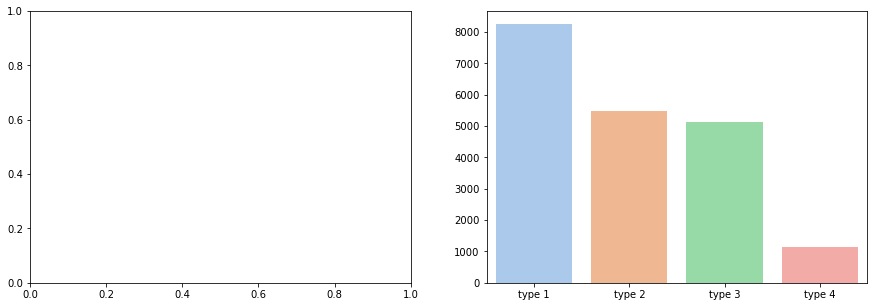

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [34]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 4,"[soniya, mummy, hot, toh, magic, stick, huma, ...",25
1,very surprising that unvaccinated population &...,type 2,"[surprising, population, yr, forcefully, expos...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 3,"[guidance, saint, greet, ram, rahim, dear, sac...",28
3,bro you know where was case covid detected ind...,type 3,"[bro, know, case, detected, india, fact, keral...",36
4,your muslim teachers intellectuals boycott cov...,type 3,"[muslim, teacher, intellectual, boycott, educa...",33


In [35]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [36]:
result = result.drop('Lemma-text', axis=1)

In [37]:
from wordcloud import WordCloud 

In [38]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

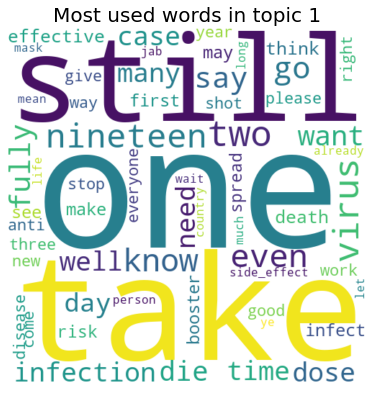

In [39]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

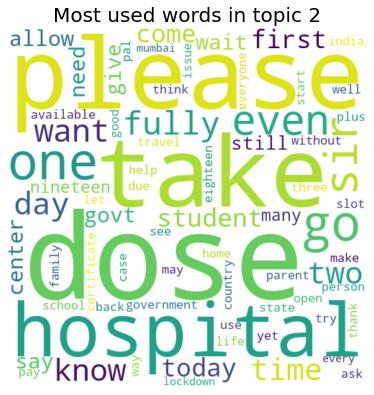

In [40]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

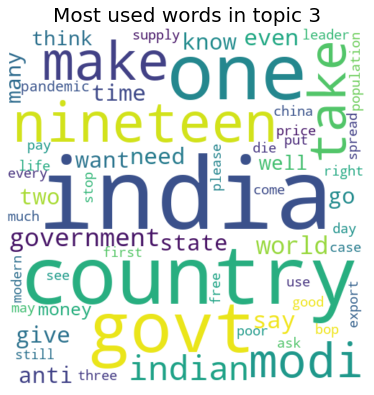

In [41]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

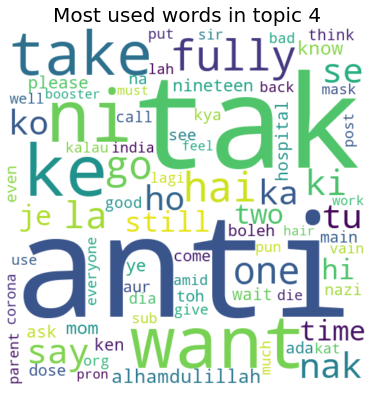

In [42]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

In [43]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

ValueError: We need at least 1 word to plot a word cloud, got 0.

### Cluster size: 5

In [44]:
mgp = MovieGroupProcess(K=5, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 14401 clusters with 5 clusters populated
In stage 1: transferred 10005 clusters with 5 clusters populated
In stage 2: transferred 7413 clusters with 5 clusters populated
In stage 3: transferred 5776 clusters with 5 clusters populated
In stage 4: transferred 4746 clusters with 5 clusters populated
In stage 5: transferred 4420 clusters with 5 clusters populated
In stage 6: transferred 4254 clusters with 5 clusters populated
In stage 7: transferred 4136 clusters with 5 clusters populated
In stage 8: transferred 3933 clusters with 5 clusters populated
In stage 9: transferred 3912 clusters with 5 clusters populated
In stage 10: transferred 3921 clusters with 5 clusters populated
In stage 11: transferred 3836 clusters with 5 clusters populated
In stage 12: transferred 3902 clusters with 5 clusters populated
In stage 13: transferred 3898 clusters with 5 clusters populated
In stage 14: transferred 3859 clusters with 5 clusters populated
In stage 15: transferred 3823 clu

In [45]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [5707 5264 2890 1356 4812]

Most important clusters (by number of docs inside): [0 1 4 2 3]

Cluster 0 : [('not', 2967), ('get', 2123), ('one', 875), ('virus', 690), ('take', 671), ('still', 653), ('even', 602), ('nineteen', 591), ('two', 540), ('know', 516)]

Cluster 1 : [('not', 2381), ('get', 1316), ('india', 974), ('country', 628), ('one', 576), ('govt', 561), ('make', 519), ('take', 517), ('nineteen', 495), ('like', 451)]

Cluster 4 : [('not', 2516), ('get', 2250), ('please', 592), ('take', 563), ('hospital', 557), ('one', 540), ('go', 517), ('dose', 497), ('sir', 438), ('even', 410)]

Cluster 2 : [('get', 1858), ('not', 834), ('take', 487), ('dose', 390), ('first', 342), ('one', 318), ('go', 296), ('day', 277), ('two', 248), ('fever', 223)]

Cluster 3 : [('not', 466), ('get', 344), ('anti', 195), ('want', 155), ('like', 115), ('go', 112), ('take', 108), ('say', 102), ('tak', 101), ('ni', 100)]


In [46]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [47]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [48]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 5,"[soniya, mummy, hot, toh, magic, stick, huma, ..."
1,very surprising that unvaccinated population &...,type 3,"[surprising, population, yr, forcefully, expos..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 4,"[guidance, saint, greet, ram, rahim, dear, sac..."
3,bro you know where was case covid detected ind...,type 2,"[bro, know, case, detected, india, fact, keral..."
4,your muslim teachers intellectuals boycott cov...,type 2,"[muslim, teacher, intellectual, boycott, educa..."


In [49]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [50]:
result['Topic']

0        type 5
1        type 3
2        type 4
3        type 2
4        type 2
          ...  
20024    type 3
20025    type 4
20026    type 1
20027    type 1
20028    type 1
Name: Topic, Length: 20029, dtype: object

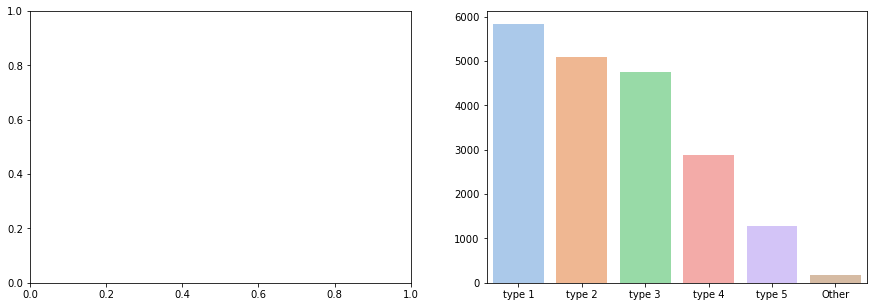

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [52]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 5,"[soniya, mummy, hot, toh, magic, stick, huma, ...",25
1,very surprising that unvaccinated population &...,type 3,"[surprising, population, yr, forcefully, expos...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 4,"[guidance, saint, greet, ram, rahim, dear, sac...",28
3,bro you know where was case covid detected ind...,type 2,"[bro, know, case, detected, india, fact, keral...",36
4,your muslim teachers intellectuals boycott cov...,type 2,"[muslim, teacher, intellectual, boycott, educa...",33


In [53]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [54]:
result = result.drop('Lemma-text', axis=1)

In [55]:
from wordcloud import WordCloud 

In [56]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

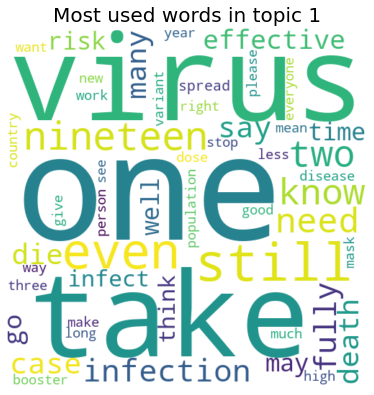

In [57]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

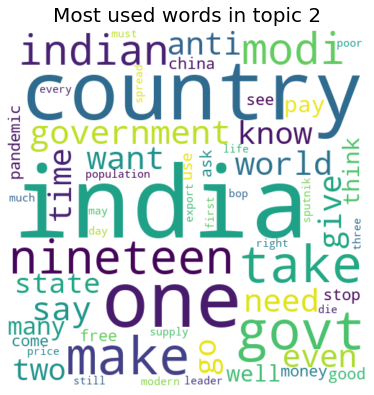

In [58]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

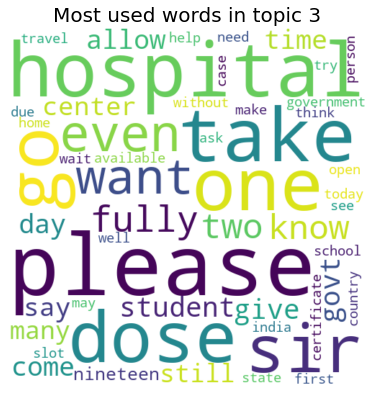

In [59]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

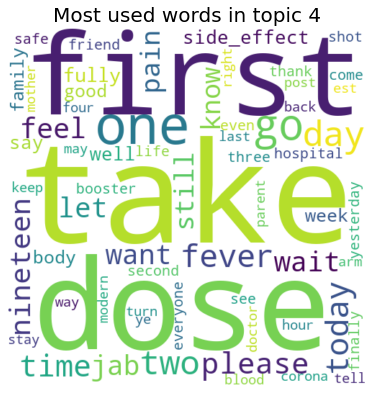

In [60]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

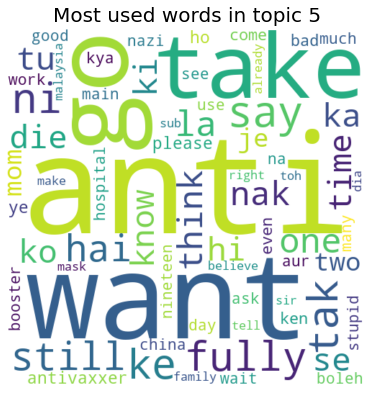

In [61]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

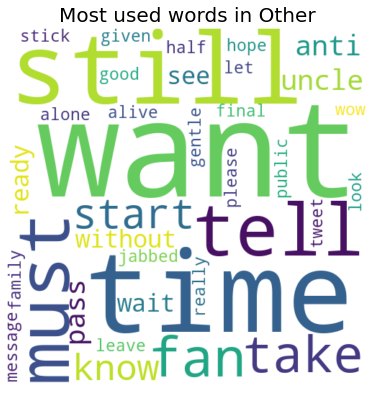

In [62]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 6

In [63]:
mgp = MovieGroupProcess(K=6, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 14845 clusters with 6 clusters populated
In stage 1: transferred 10532 clusters with 6 clusters populated
In stage 2: transferred 8407 clusters with 6 clusters populated
In stage 3: transferred 6385 clusters with 6 clusters populated
In stage 4: transferred 4988 clusters with 6 clusters populated
In stage 5: transferred 4446 clusters with 6 clusters populated
In stage 6: transferred 4091 clusters with 6 clusters populated
In stage 7: transferred 3931 clusters with 6 clusters populated
In stage 8: transferred 3812 clusters with 6 clusters populated
In stage 9: transferred 3802 clusters with 6 clusters populated
In stage 10: transferred 3725 clusters with 6 clusters populated
In stage 11: transferred 3665 clusters with 6 clusters populated
In stage 12: transferred 3605 clusters with 6 clusters populated
In stage 13: transferred 3555 clusters with 6 clusters populated
In stage 14: transferred 3540 clusters with 6 clusters populated
In stage 15: transferred 3549 clu

In [64]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [ 727 3281  236 4969 4465 6351]

Most important clusters (by number of docs inside): [5 3 4 1 0 2]

Cluster 5 : [('not', 3363), ('get', 2340), ('one', 992), ('take', 737), ('still', 723), ('virus', 715), ('even', 672), ('nineteen', 595), ('two', 585), ('know', 514)]

Cluster 3 : [('not', 2212), ('get', 1245), ('india', 985), ('country', 598), ('one', 553), ('govt', 540), ('take', 488), ('make', 482), ('nineteen', 473), ('like', 431)]

Cluster 4 : [('not', 2250), ('get', 2195), ('please', 586), ('dose', 562), ('hospital', 558), ('take', 515), ('one', 462), ('sir', 447), ('go', 434), ('even', 359)]

Cluster 1 : [('get', 1928), ('not', 1120), ('take', 563), ('go', 402), ('first', 354), ('dose', 345), ('one', 325), ('want', 319), ('like', 287), ('two', 274)]

Cluster 0 : [('not', 179), ('get', 162), ('anti', 103), ('tak', 96), ('ke', 83), ('ni', 81), ('hai', 78), ('se', 59), ('ki', 59), ('like', 58)]

Cluster 2 : [('nineteen', 55), ('not', 40), ('anti', 28),

In [65]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [66]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [67]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 5,"[soniya, mummy, hot, toh, magic, stick, huma, ..."
1,very surprising that unvaccinated population &...,type 3,"[surprising, population, yr, forcefully, expos..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[guidance, saint, greet, ram, rahim, dear, sac..."
3,bro you know where was case covid detected ind...,type 2,"[bro, know, case, detected, india, fact, keral..."
4,your muslim teachers intellectuals boycott cov...,type 2,"[muslim, teacher, intellectual, boycott, educa..."


In [68]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [69]:
result['Topic']

0        type 5
1        type 3
2        type 2
3        type 2
4        type 2
          ...  
20024    type 3
20025    type 4
20026    type 1
20027    type 1
20028    type 1
Name: Topic, Length: 20029, dtype: object

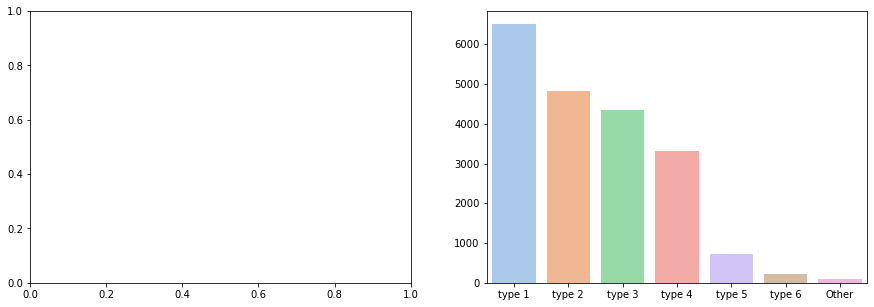

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [71]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 5,"[soniya, mummy, hot, toh, magic, stick, huma, ...",25
1,very surprising that unvaccinated population &...,type 3,"[surprising, population, yr, forcefully, expos...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[guidance, saint, greet, ram, rahim, dear, sac...",28
3,bro you know where was case covid detected ind...,type 2,"[bro, know, case, detected, india, fact, keral...",36
4,your muslim teachers intellectuals boycott cov...,type 2,"[muslim, teacher, intellectual, boycott, educa...",33


In [72]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [73]:
result = result.drop('Lemma-text', axis=1)

In [74]:
from wordcloud import WordCloud 

In [75]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

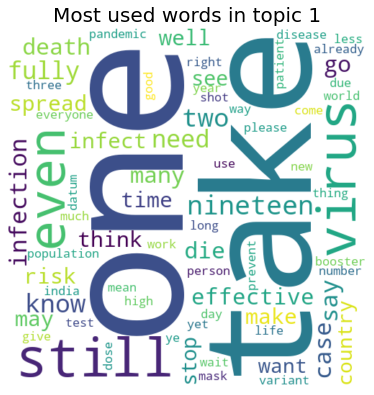

In [76]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

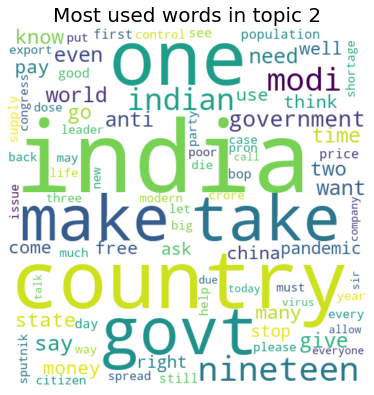

In [77]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

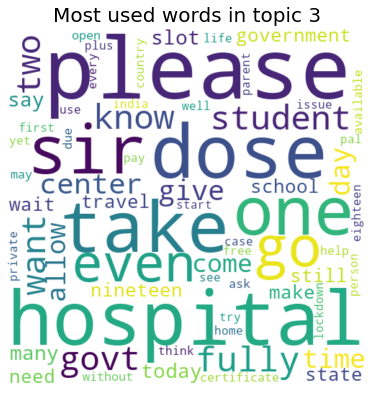

In [78]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

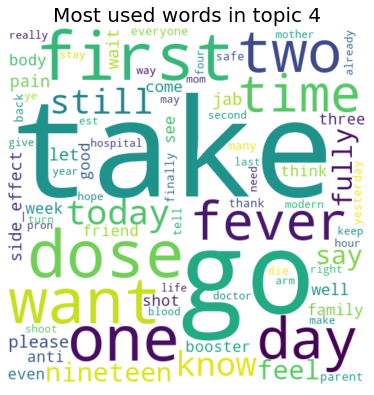

In [79]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

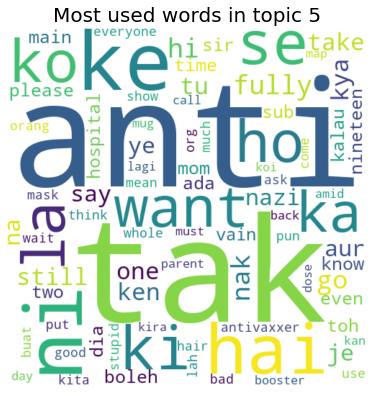

In [80]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

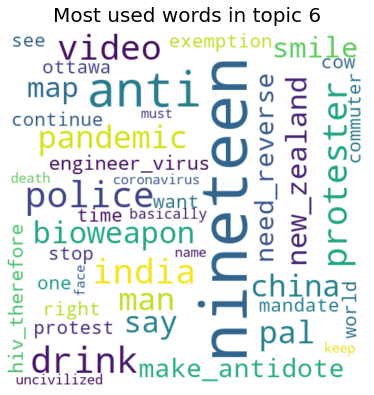

In [81]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

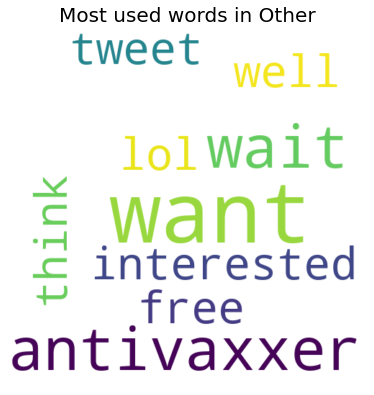

In [82]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 7

In [83]:
mgp = MovieGroupProcess(K=7, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 15450 clusters with 7 clusters populated
In stage 1: transferred 10819 clusters with 7 clusters populated
In stage 2: transferred 8277 clusters with 7 clusters populated
In stage 3: transferred 6685 clusters with 7 clusters populated
In stage 4: transferred 5814 clusters with 7 clusters populated
In stage 5: transferred 5299 clusters with 7 clusters populated
In stage 6: transferred 4943 clusters with 7 clusters populated
In stage 7: transferred 4595 clusters with 7 clusters populated
In stage 8: transferred 4412 clusters with 7 clusters populated
In stage 9: transferred 4303 clusters with 7 clusters populated
In stage 10: transferred 4131 clusters with 7 clusters populated
In stage 11: transferred 3914 clusters with 7 clusters populated
In stage 12: transferred 3855 clusters with 7 clusters populated
In stage 13: transferred 3737 clusters with 7 clusters populated
In stage 14: transferred 3672 clusters with 7 clusters populated
In stage 15: transferred 3720 clu

In [84]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [2152 1232 3084 4236 2579 6387  359]

Most important clusters (by number of docs inside): [5 3 2 4 0 1 6]

Cluster 5 : [('get', 3450), ('not', 3338), ('take', 1088), ('one', 783), ('go', 638), ('want', 634), ('like', 546), ('know', 538), ('say', 538), ('still', 483)]

Cluster 3 : [('not', 1838), ('get', 939), ('india', 911), ('country', 569), ('one', 527), ('govt', 512), ('nineteen', 432), ('make', 404), ('modi', 395), ('take', 349)]

Cluster 2 : [('not', 1365), ('get', 898), ('virus', 509), ('one', 477), ('infection', 416), ('still', 368), ('nineteen', 357), ('even', 352), ('two', 334), ('death', 319)]

Cluster 4 : [('get', 1544), ('not', 1065), ('dose', 524), ('hospital', 508), ('please', 345), ('take', 343), ('one', 281), ('sir', 281), ('center', 246), ('today', 242)]

Cluster 0 : [('not', 1153), ('get', 588), ('fully', 318), ('student', 311), ('allow', 263), ('please', 233), ('even', 216), ('go', 213), ('school', 205), ('travel', 198)]

Cluster 1 : [

In [85]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [86]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [87]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 7,"[soniya, mummy, hot, toh, magic, stick, huma, ..."
1,very surprising that unvaccinated population &...,type 5,"[surprising, population, yr, forcefully, expos..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[guidance, saint, greet, ram, rahim, dear, sac..."
3,bro you know where was case covid detected ind...,type 3,"[bro, know, case, detected, india, fact, keral..."
4,your muslim teachers intellectuals boycott cov...,type 2,"[muslim, teacher, intellectual, boycott, educa..."


In [88]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [89]:
result['Topic']

0        type 7
1        type 5
2        type 2
3        type 3
4        type 2
          ...  
20024    type 4
20025    type 6
20026    type 3
20027    type 1
20028    type 1
Name: Topic, Length: 20029, dtype: object

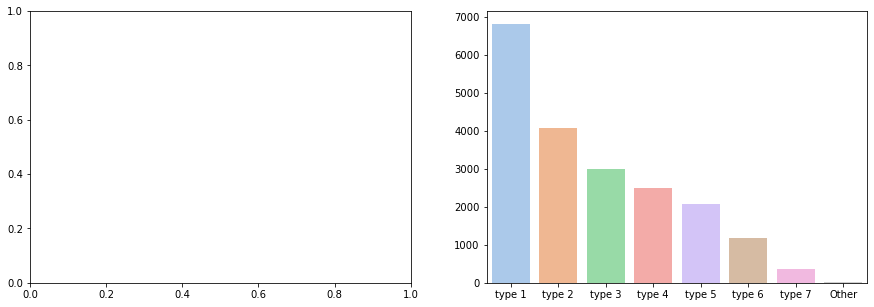

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [91]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 7,"[soniya, mummy, hot, toh, magic, stick, huma, ...",25
1,very surprising that unvaccinated population &...,type 5,"[surprising, population, yr, forcefully, expos...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[guidance, saint, greet, ram, rahim, dear, sac...",28
3,bro you know where was case covid detected ind...,type 3,"[bro, know, case, detected, india, fact, keral...",36
4,your muslim teachers intellectuals boycott cov...,type 2,"[muslim, teacher, intellectual, boycott, educa...",33


In [92]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [93]:
result = result.drop('Lemma-text', axis=1)

In [94]:
from wordcloud import WordCloud 

In [95]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

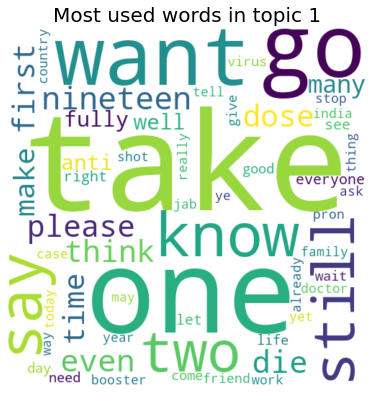

In [96]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

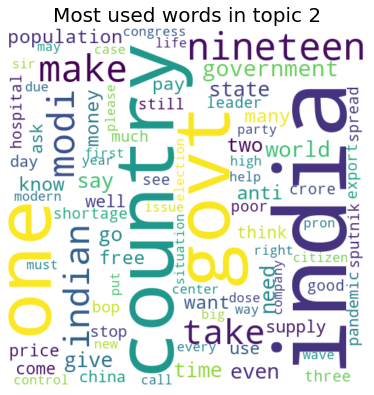

In [97]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

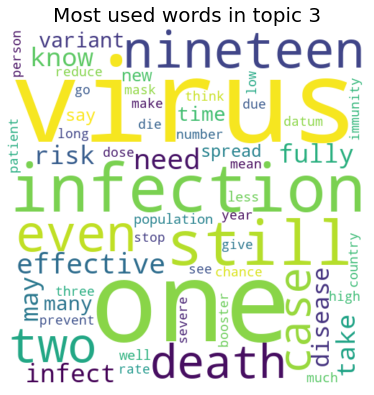

In [98]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

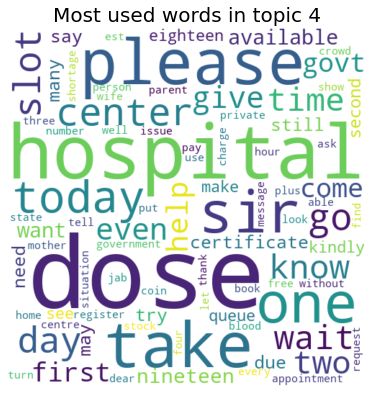

In [99]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

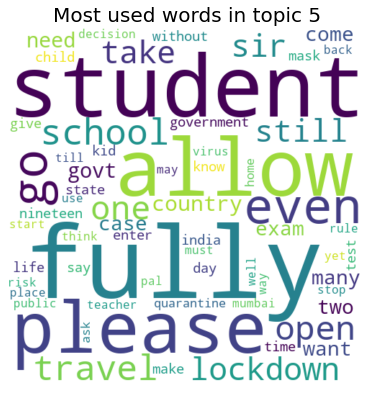

In [100]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

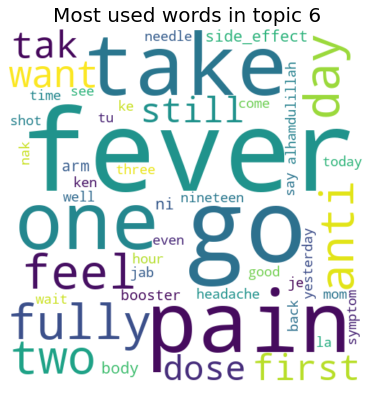

In [101]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

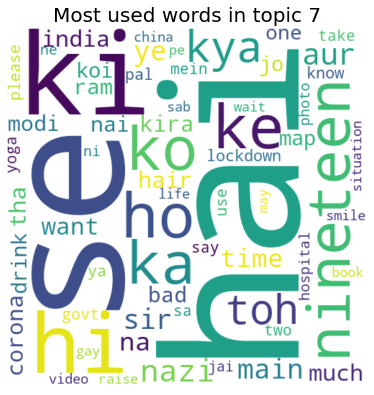

In [102]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

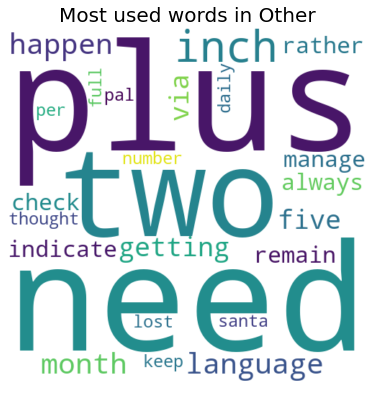

In [103]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 8

In [104]:
mgp = MovieGroupProcess(K=8, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 15901 clusters with 8 clusters populated
In stage 1: transferred 11112 clusters with 8 clusters populated
In stage 2: transferred 8647 clusters with 8 clusters populated
In stage 3: transferred 6880 clusters with 8 clusters populated
In stage 4: transferred 5564 clusters with 8 clusters populated
In stage 5: transferred 4877 clusters with 8 clusters populated
In stage 6: transferred 4443 clusters with 8 clusters populated
In stage 7: transferred 4100 clusters with 8 clusters populated
In stage 8: transferred 4027 clusters with 8 clusters populated
In stage 9: transferred 3973 clusters with 8 clusters populated
In stage 10: transferred 3879 clusters with 8 clusters populated
In stage 11: transferred 3797 clusters with 8 clusters populated
In stage 12: transferred 3813 clusters with 8 clusters populated
In stage 13: transferred 3827 clusters with 8 clusters populated
In stage 14: transferred 3742 clusters with 8 clusters populated
In stage 15: transferred 3776 clu

In [105]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [1438 1631   66 1953 5219 5486 3915  321]

Most important clusters (by number of docs inside): [5 4 6 3 1 0 7 2]

Cluster 5 : [('not', 2735), ('get', 2317), ('one', 870), ('take', 762), ('virus', 661), ('still', 636), ('two', 595), ('even', 590), ('nineteen', 546), ('know', 479)]

Cluster 4 : [('not', 2625), ('get', 1499), ('india', 832), ('country', 678), ('one', 591), ('take', 550), ('make', 507), ('nineteen', 500), ('like', 479), ('want', 465)]

Cluster 6 : [('get', 2440), ('not', 1668), ('dose', 633), ('hospital', 579), ('take', 552), ('please', 484), ('one', 440), ('go', 372), ('sir', 338), ('today', 335)]

Cluster 3 : [('get', 814), ('not', 636), ('go', 234), ('take', 226), ('want', 212), ('anti', 186), ('like', 183), ('fever', 173), ('fully', 163), ('two', 158)]

Cluster 1 : [('not', 893), ('get', 434), ('student', 295), ('fully', 293), ('allow', 209), ('school', 204), ('please', 176), ('travel', 175), ('one', 157), ('open', 155)]

Cluster 0 : [('

In [106]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [107]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [108]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 7,"[soniya, mummy, hot, toh, magic, stick, huma, ..."
1,very surprising that unvaccinated population &...,type 5,"[surprising, population, yr, forcefully, expos..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 8,"[guidance, saint, greet, ram, rahim, dear, sac..."
3,bro you know where was case covid detected ind...,type 6,"[bro, know, case, detected, india, fact, keral..."
4,your muslim teachers intellectuals boycott cov...,type 6,"[muslim, teacher, intellectual, boycott, educa..."


In [109]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [110]:
result['Topic']

0        type 7
1        type 5
2        type 8
3        type 6
4        type 6
          ...  
20024    type 3
20025    type 2
20026    type 1
20027    type 1
20028    type 1
Name: Topic, Length: 20029, dtype: object

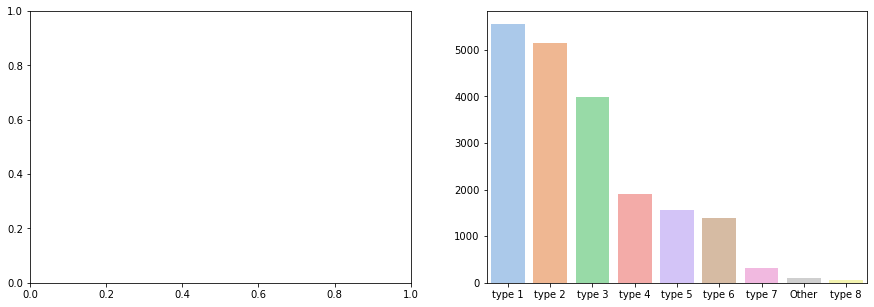

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [112]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 7,"[soniya, mummy, hot, toh, magic, stick, huma, ...",25
1,very surprising that unvaccinated population &...,type 5,"[surprising, population, yr, forcefully, expos...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 8,"[guidance, saint, greet, ram, rahim, dear, sac...",28
3,bro you know where was case covid detected ind...,type 6,"[bro, know, case, detected, india, fact, keral...",36
4,your muslim teachers intellectuals boycott cov...,type 6,"[muslim, teacher, intellectual, boycott, educa...",33


In [113]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [114]:
result = result.drop('Lemma-text', axis=1)

In [115]:
from wordcloud import WordCloud 

In [116]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

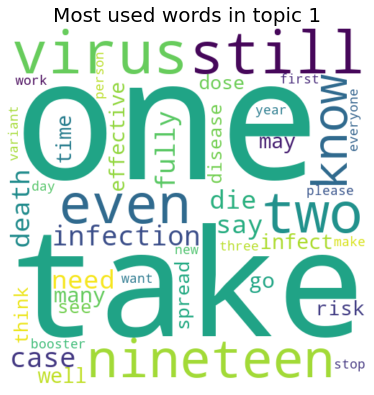

In [117]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

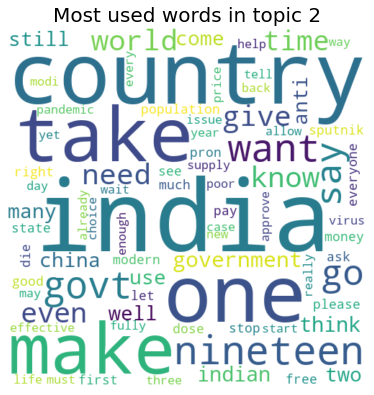

In [118]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

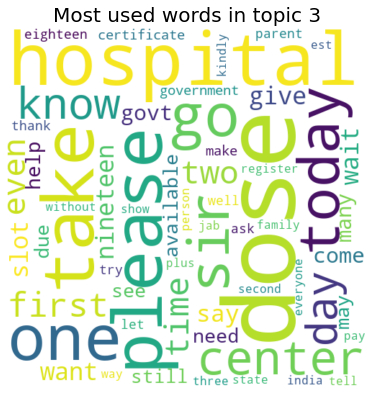

In [119]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

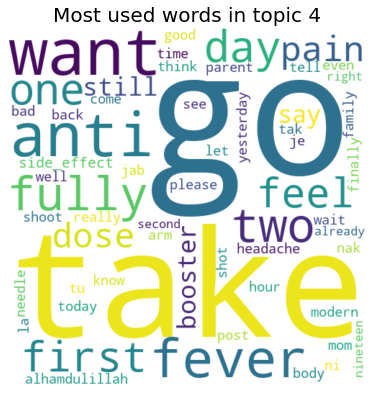

In [120]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

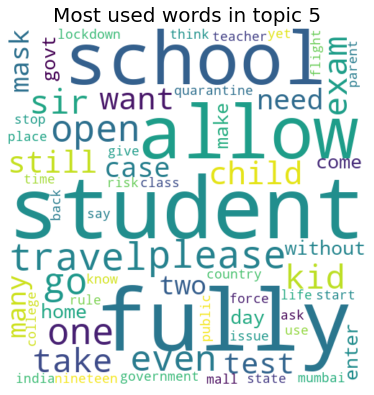

In [121]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

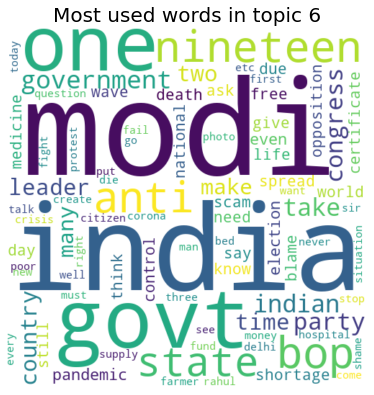

In [122]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

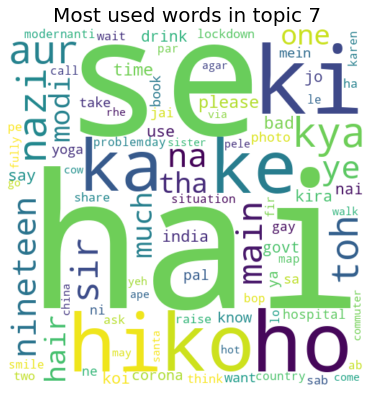

In [123]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

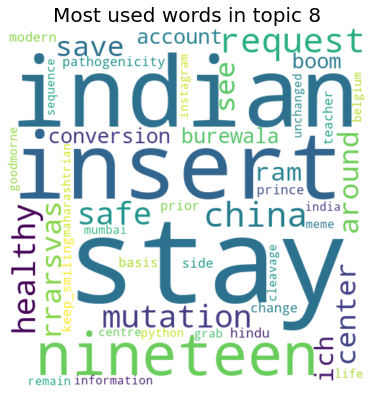

In [124]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

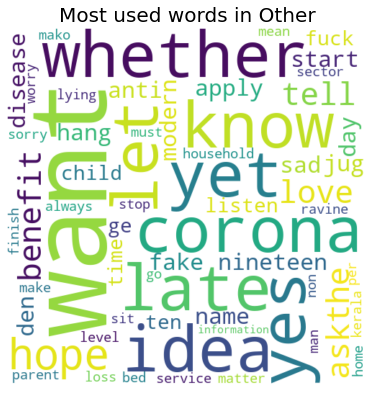

In [125]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 9

In [126]:
mgp = MovieGroupProcess(K=9, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 16167 clusters with 9 clusters populated
In stage 1: transferred 11183 clusters with 9 clusters populated
In stage 2: transferred 8352 clusters with 9 clusters populated
In stage 3: transferred 6562 clusters with 9 clusters populated
In stage 4: transferred 5664 clusters with 9 clusters populated
In stage 5: transferred 5005 clusters with 9 clusters populated
In stage 6: transferred 4470 clusters with 9 clusters populated
In stage 7: transferred 4162 clusters with 9 clusters populated
In stage 8: transferred 3879 clusters with 9 clusters populated
In stage 9: transferred 3789 clusters with 9 clusters populated
In stage 10: transferred 3832 clusters with 9 clusters populated
In stage 11: transferred 3648 clusters with 9 clusters populated
In stage 12: transferred 3645 clusters with 9 clusters populated
In stage 13: transferred 3535 clusters with 9 clusters populated
In stage 14: transferred 3528 clusters with 9 clusters populated
In stage 15: transferred 3470 clu

In [127]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [7709  921   17 3087   83  128 5392   85 2607]

Most important clusters (by number of docs inside): [0 6 3 8 1 5 7 4 2]

Cluster 0 : [('not', 3731), ('get', 3392), ('one', 1108), ('take', 1070), ('still', 781), ('two', 779), ('virus', 728), ('even', 688), ('nineteen', 669), ('know', 656)]

Cluster 6 : [('not', 2440), ('get', 1407), ('india', 1025), ('country', 657), ('one', 625), ('govt', 590), ('nineteen', 535), ('take', 518), ('make', 516), ('like', 437)]

Cluster 3 : [('get', 2013), ('not', 1267), ('dose', 562), ('hospital', 503), ('take', 415), ('please', 385), ('one', 337), ('go', 314), ('today', 293), ('sir', 274)]

Cluster 8 : [('not', 1438), ('get', 807), ('fully', 379), ('student', 317), ('please', 279), ('allow', 266), ('take', 259), ('go', 256), ('even', 246), ('travel', 236)]

Cluster 1 : [('not', 256), ('get', 221), ('anti', 115), ('tak', 100), ('ni', 96), ('like', 86), ('want', 83), ('ke', 83), ('take', 82), ('fully', 81)]

Cluster 5 : [('a

In [128]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [129]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [130]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 5,"[soniya, mummy, hot, toh, magic, stick, huma, ..."
1,very surprising that unvaccinated population &...,type 4,"[surprising, population, yr, forcefully, expos..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[guidance, saint, greet, ram, rahim, dear, sac..."
3,bro you know where was case covid detected ind...,type 2,"[bro, know, case, detected, india, fact, keral..."
4,your muslim teachers intellectuals boycott cov...,type 2,"[muslim, teacher, intellectual, boycott, educa..."


In [131]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [132]:
result['Topic']

0        type 5
1        type 4
2        type 2
3        type 2
4        type 2
          ...  
20024    type 3
20025    type 4
20026    type 1
20027    type 1
20028    type 1
Name: Topic, Length: 20029, dtype: object

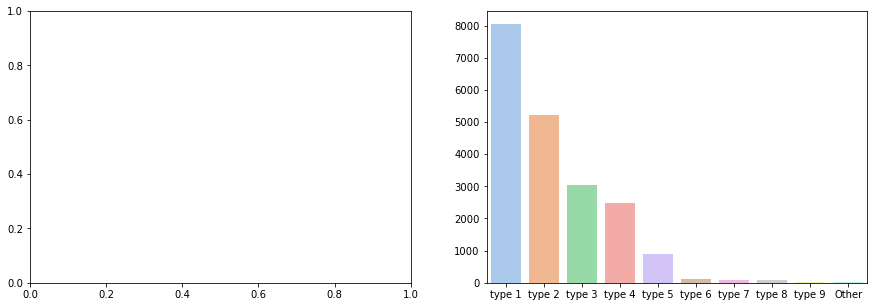

In [133]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [134]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 5,"[soniya, mummy, hot, toh, magic, stick, huma, ...",25
1,very surprising that unvaccinated population &...,type 4,"[surprising, population, yr, forcefully, expos...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[guidance, saint, greet, ram, rahim, dear, sac...",28
3,bro you know where was case covid detected ind...,type 2,"[bro, know, case, detected, india, fact, keral...",36
4,your muslim teachers intellectuals boycott cov...,type 2,"[muslim, teacher, intellectual, boycott, educa...",33


In [135]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [136]:
result = result.drop('Lemma-text', axis=1)

In [137]:
from wordcloud import WordCloud 

In [138]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

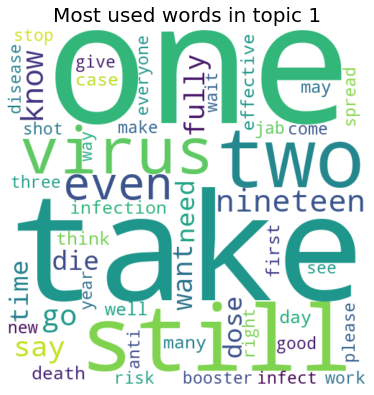

In [139]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

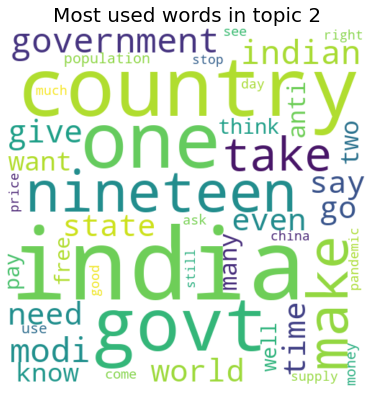

In [140]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

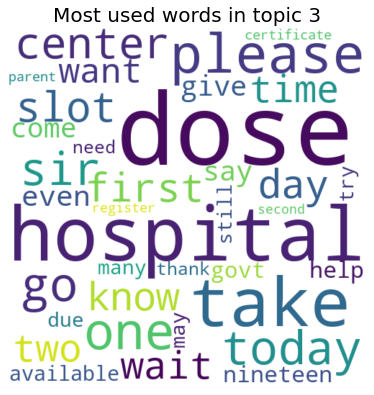

In [141]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

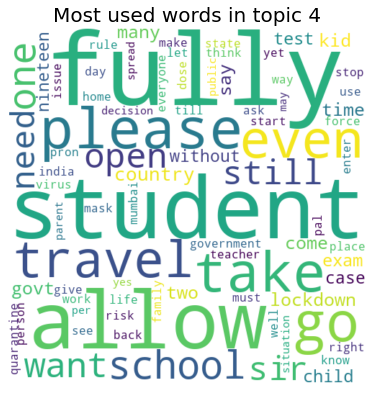

In [142]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

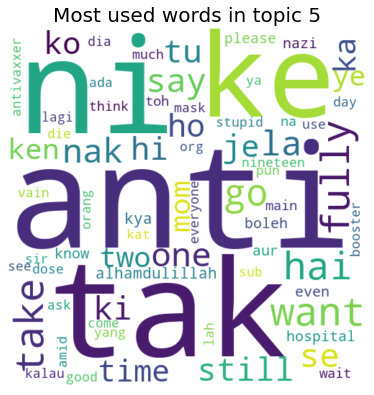

In [143]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

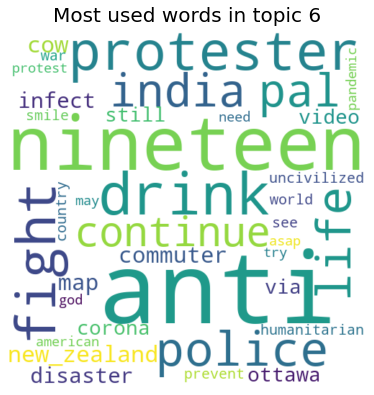

In [144]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

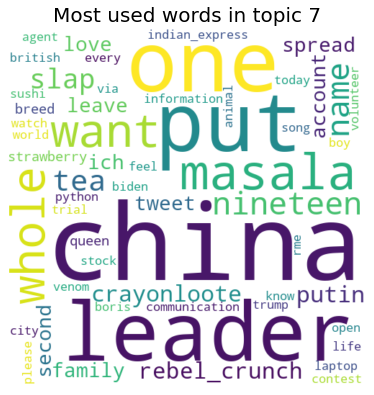

In [145]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

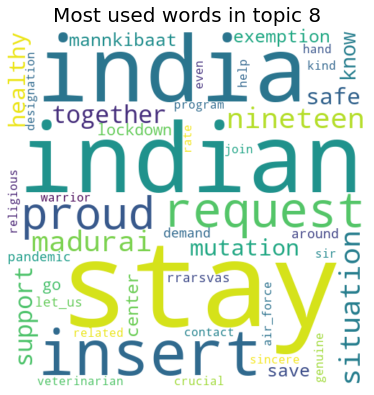

In [146]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

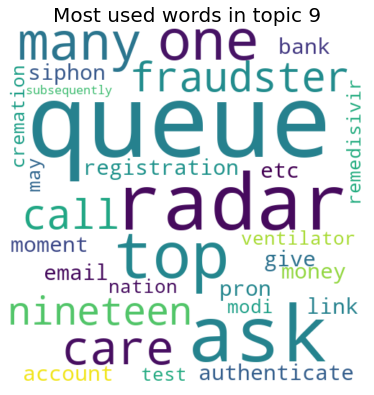

In [147]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

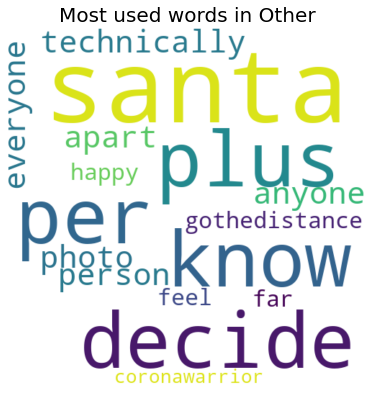

In [148]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 10

In [149]:
mgp = MovieGroupProcess(K=10, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 16346 clusters with 10 clusters populated
In stage 1: transferred 11448 clusters with 10 clusters populated
In stage 2: transferred 8855 clusters with 10 clusters populated
In stage 3: transferred 7116 clusters with 10 clusters populated
In stage 4: transferred 6093 clusters with 10 clusters populated
In stage 5: transferred 5425 clusters with 10 clusters populated
In stage 6: transferred 4735 clusters with 10 clusters populated
In stage 7: transferred 4280 clusters with 10 clusters populated
In stage 8: transferred 4059 clusters with 10 clusters populated
In stage 9: transferred 3853 clusters with 10 clusters populated
In stage 10: transferred 3800 clusters with 10 clusters populated
In stage 11: transferred 3767 clusters with 10 clusters populated
In stage 12: transferred 3616 clusters with 10 clusters populated
In stage 13: transferred 3636 clusters with 10 clusters populated
In stage 14: transferred 3605 clusters with 10 clusters populated
In stage 15: trans

In [150]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [  11  104   37 3294 4962 7050   40  310 2011 2210]

Most important clusters (by number of docs inside): [5 4 3 9 8 7 1 6 2 0]

Cluster 5 : [('not', 3643), ('get', 2887), ('one', 1091), ('take', 908), ('still', 763), ('virus', 727), ('even', 703), ('two', 694), ('nineteen', 676), ('know', 598)]

Cluster 4 : [('get', 2733), ('not', 2383), ('please', 668), ('take', 649), ('dose', 637), ('hospital', 521), ('one', 493), ('go', 483), ('sir', 447), ('even', 374)]

Cluster 3 : [('not', 1533), ('get', 807), ('india', 576), ('anti', 350), ('country', 343), ('take', 323), ('like', 316), ('make', 314), ('nineteen', 304), ('one', 303)]

Cluster 9 : [('get', 929), ('not', 734), ('take', 292), ('go', 263), ('want', 236), ('one', 202), ('like', 199), ('fever', 196), ('fully', 187), ('first', 181)]

Cluster 8 : [('not', 789), ('get', 429), ('india', 363), ('govt', 351), ('one', 248), ('country', 232), ('government', 220), ('nineteen', 217), ('free', 210), ('pay', 203)]


In [151]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9',
               'type 10'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [152]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [153]:
mgp = MovieGroupProcess(K=9, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 16212 clusters with 9 clusters populated
In stage 1: transferred 11432 clusters with 9 clusters populated
In stage 2: transferred 8759 clusters with 9 clusters populated
In stage 3: transferred 6695 clusters with 9 clusters populated
In stage 4: transferred 5562 clusters with 9 clusters populated
In stage 5: transferred 4946 clusters with 9 clusters populated
In stage 6: transferred 4564 clusters with 9 clusters populated
In stage 7: transferred 4437 clusters with 9 clusters populated
In stage 8: transferred 4268 clusters with 9 clusters populated
In stage 9: transferred 4147 clusters with 9 clusters populated
In stage 10: transferred 4009 clusters with 9 clusters populated
In stage 11: transferred 3989 clusters with 9 clusters populated
In stage 12: transferred 3859 clusters with 9 clusters populated
In stage 13: transferred 3729 clusters with 9 clusters populated
In stage 14: transferred 3726 clusters with 9 clusters populated
In stage 15: transferred 3703 clu

In [154]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [ 575 4784   26 3874 5310   65 4483   51  861]

Most important clusters (by number of docs inside): [4 1 6 3 8 0 5 7 2]

Cluster 4 : [('not', 2865), ('get', 2161), ('take', 636), ('want', 604), ('go', 601), ('one', 552), ('like', 491), ('fully', 480), ('say', 446), ('still', 408)]

Cluster 1 : [('not', 2089), ('get', 1198), ('india', 970), ('govt', 594), ('country', 578), ('one', 568), ('nineteen', 486), ('make', 446), ('take', 420), ('government', 400)]

Cluster 6 : [('not', 2167), ('get', 1688), ('one', 733), ('virus', 618), ('take', 567), ('even', 499), ('still', 498), ('two', 498), ('nineteen', 465), ('infection', 444)]

Cluster 3 : [('get', 2450), ('not', 1490), ('dose', 725), ('take', 588), ('hospital', 469), ('please', 422), ('go', 408), ('one', 406), ('first', 383), ('day', 381)]

Cluster 8 : [('not', 229), ('get', 218), ('tak', 98), ('anti', 93), ('ni', 91), ('ke', 85), ('hai', 80), ('fully', 79), ('like', 78), ('take', 65)]

Cluster 0 : [('not'

In [155]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [156]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [157]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 5,"[soniya, mummy, hot, toh, magic, stick, huma, ..."
1,very surprising that unvaccinated population &...,type 6,"[surprising, population, yr, forcefully, expos..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 9,"[guidance, saint, greet, ram, rahim, dear, sac..."
3,bro you know where was case covid detected ind...,type 2,"[bro, know, case, detected, india, fact, keral..."
4,your muslim teachers intellectuals boycott cov...,type 6,"[muslim, teacher, intellectual, boycott, educa..."


In [158]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [159]:
result['Topic']

0        type 5
1        type 6
2        type 9
3        type 2
4        type 6
          ...  
20024    type 4
20025    type 1
20026    type 3
20027    type 3
20028    type 3
Name: Topic, Length: 20029, dtype: object

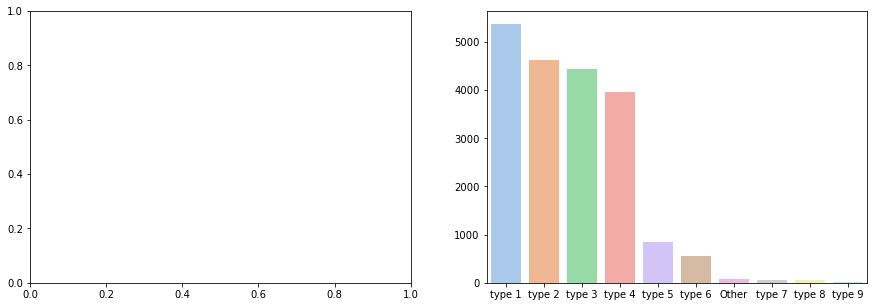

In [160]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [161]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 5,"[soniya, mummy, hot, toh, magic, stick, huma, ...",25
1,very surprising that unvaccinated population &...,type 6,"[surprising, population, yr, forcefully, expos...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 9,"[guidance, saint, greet, ram, rahim, dear, sac...",28
3,bro you know where was case covid detected ind...,type 2,"[bro, know, case, detected, india, fact, keral...",36
4,your muslim teachers intellectuals boycott cov...,type 6,"[muslim, teacher, intellectual, boycott, educa...",33


In [162]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [163]:
result = result.drop('Lemma-text', axis=1)

In [164]:
from wordcloud import WordCloud 

In [165]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

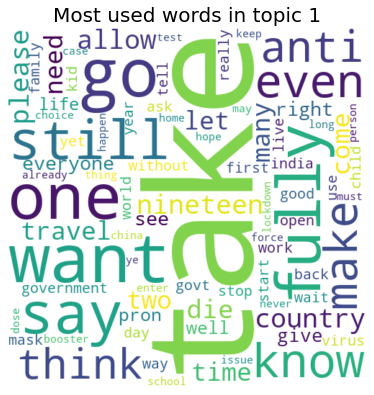

In [166]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

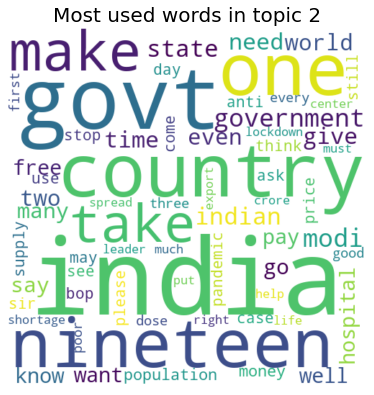

In [167]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

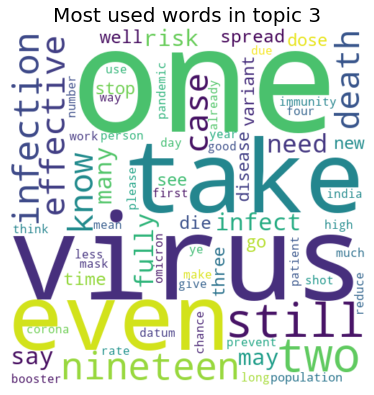

In [168]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

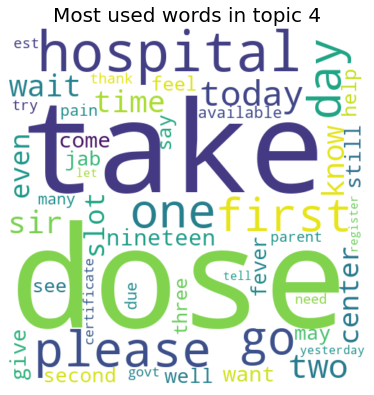

In [169]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

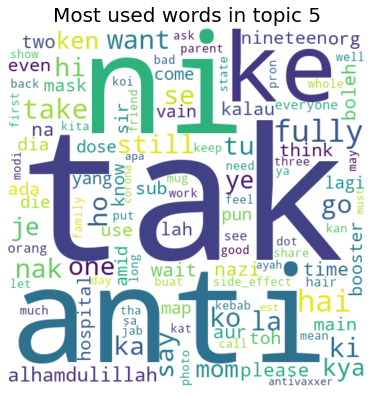

In [170]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

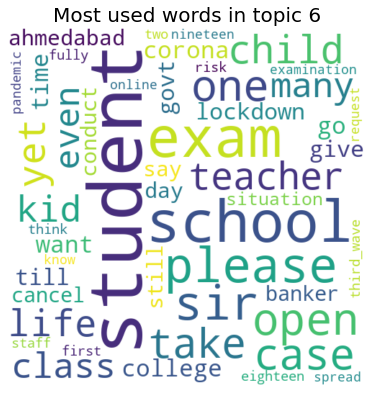

In [171]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

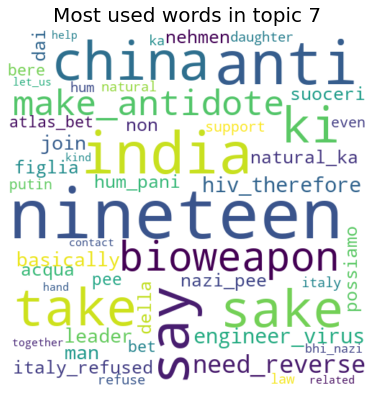

In [172]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

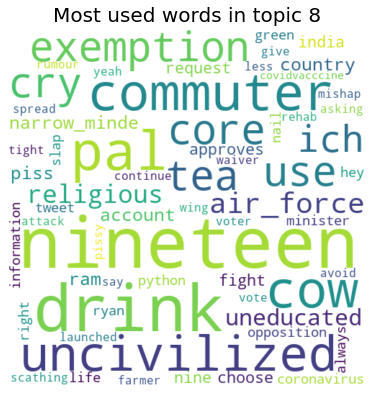

In [173]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

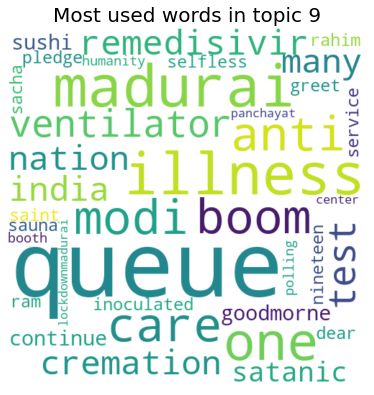

In [174]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

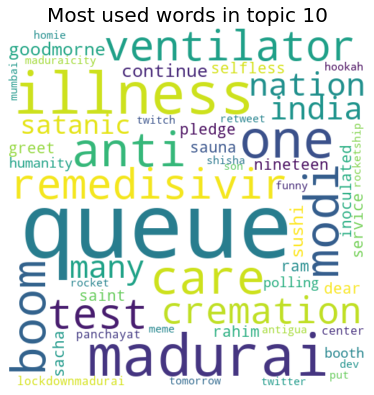

In [175]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 10")

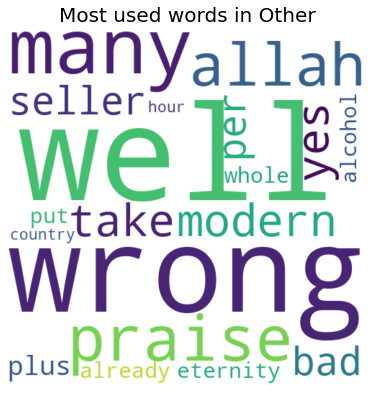

In [176]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")